# **L2 norm varying the number of modes, for the $\mu$ reference and worst reconstructed**

In [1]:
# Pulizia
from IPython import get_ipython
get_ipython().magic('clear')
get_ipython().magic('reset -f')

# Import libraries:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy as sp
import scipy.sparse as sparse
import h5py
import sys
import os
import json

# Import user-defined libraries:
from FreeFEM import FFmatrix_fread, FFvector_fread
from solver_class import FiniteElementCylinderSolver, ReducedBasisCylinderSolver

/var/folders/gs/p2p59ns16hlgpqv_027665gm0000gn/T/ipykernel_2322/2085257475.py:3: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  get_ipython().magic('clear')
/var/folders/gs/p2p59ns16hlgpqv_027665gm0000gn/T/ipykernel_2322/2085257475.py:4: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  get_ipython().magic('reset -f')


In [2]:
# Load coordinates:
coordinates_Px = FFvector_fread('mesh_utilities/vv_cc_Px.btxt')
coordinates_Pq = FFvector_fread('mesh_utilities/vv_cc_Pq.btxt')

# Identify degrees of freedom of the Px and Pq spaces:
sFO_Px = coordinates_Px.shape[0]
sFO_Pq = coordinates_Pq.shape[0]
print(rf'Degree of freedom = {sFO_Px}')

# Define vector of all Px indeces:
mask_all = np.arange(sFO_Px, dtype=int)

# Identify indeces of the top, bottom and middle boundaries in Px:
mask_inf_bc = mask_all[np.isclose([coordinates_Px[ii, 1] for ii in range(sFO_Px)], np.zeros((sFO_Px)))]
mask_sup_bc = mask_all[np.isclose([coordinates_Px[ii, 1] for ii in range(sFO_Px)], np.ones((sFO_Px)))]
mask_mid_bc = mask_all[np.isclose([coordinates_Px[ii, 0] for ii in range(sFO_Px)], np.zeros((sFO_Px)))]
mask_ext_bc = mask_all[np.isclose([coordinates_Px[ii, 0] for ii in range(sFO_Px)], np.ones((sFO_Px)))]

# Identify indeces of the Dirichlet b.c. for the temperature and concentration field:
mask_bc_T = np.fromiter(set(mask_sup_bc), int)
mask_bc_C = np.fromiter(set(mask_sup_bc) | set(mask_ext_bc) | set(mask_inf_bc), int)

# Identify indeces of the interior for the temperature and concentration field:
mask_in_T = [ii for ii in mask_all if ii not in mask_bc_T]
mask_in_C = [ii for ii in mask_all if ii not in mask_bc_C]

# Import mass matrices on the Px and on the Pq space:
mass_Px = FFmatrix_fread('mesh_utilities/ww_mm_Px.btxt')
mass_Pq = FFmatrix_fread('mesh_utilities/ww_mm_Pq.btxt')
mass_Pm = FFmatrix_fread('mesh_utilities/ww_uu_Px_Pq.btxt')

# Extract integration weights and diagonal matrix with their inverse:
weights_Pq = mass_Pq.diagonal()
project_Pq = sparse.diags(np.reciprocal(weights_Pq))

# Import map from Px to Pq and to the dx, dy, dz derivative evaluated in Pq:
PxtoPquu_C = project_Pq.dot(FFmatrix_fread('mesh_utilities/ww_uu_Px_Pq.btxt')[:, mask_in_C])
PxtoPqdx_C = project_Pq.dot(FFmatrix_fread('mesh_utilities/ww_dx_Px_Pq.btxt')[:, mask_in_C])
PxtoPqdy_C = project_Pq.dot(FFmatrix_fread('mesh_utilities/ww_dy_Px_Pq.btxt')[:, mask_in_C])

# Define weights for the integration in polar coordinates:
polar_weights_Pq = np.multiply(coordinates_Pq[:, 0], weights_Pq)

# Compute volume of the domain:
volume = np.dot(np.ones(sFO_Pq), polar_weights_Pq)

# Assemble mass matrix and projected forcing term:
forc_C = PxtoPquu_C.T.dot(polar_weights_Pq[:, None])
mass_C = PxtoPquu_C.T.dot(PxtoPquu_C.multiply(polar_weights_Pq[:, None]))
inte_C = PxtoPquu_C.T.dot(polar_weights_Pq) / volume

Degree of freedom = 10201


## **Reference parameters**

In [6]:
# Lettura dei parametri di riferimento dal file JSON
with open("data/Reference_parameters.json", "r") as json_file:
    parameters = json.load(json_file)
FISSION_ENERGY = parameters["FISSION_ENERGY"] 
FISSION_RATE = parameters["FISSION_RATE"]  
T_BC = parameters["T_BC"]  
LENGTH = parameters["LENGTH"]  
RADIUS = parameters["RADIUS"]  
FISSION_YIELD = parameters["FISSION_YIELD"]  
FUEL_THERMAL_CONDUCTIVITY  = parameters["FUEL_THERMAL_CONDUCTIVITY"]  
TIME_DELTA = 1.00E+04
SOURCE_C = FISSION_RATE * FISSION_YIELD         #[atm / (m^3 s)]
GAMMA_T = (FISSION_RATE * FISSION_ENERGY * LENGTH**2)/(FUEL_THERMAL_CONDUCTIVITY)

solution_FO = np.loadtxt('reference case/Fullorder_Cfield.csv', delimiter=',')  # Soluzione FOM
MM_FO = np.load('model_files/XX_FO.npy', allow_pickle=True)[0]  # Matrice per norma L2

with h5py.File('checkpoint/matrici_RB.h5', 'r') as hf:
    ZZ_CO = hf['ZZ_CO'][:]
    II_CO = hf['II_CO'][:]
    basis = hf['basis'][:]

TT = T_BC + GAMMA_T * (1 - ZZ_CO**2) / 2
WW = 7.60E-10 * np.exp(- 4.86E-19 / (TT * 1.380649E-23)) +\
     5.64E-25 * np.exp(- 1.91E-19 / (TT * 1.380649E-23)) * np.sqrt(FISSION_RATE) +\
     8.00E-40 * FISSION_RATE
CC_CO = np.hstack((II_CO @ WW / RADIUS**2, II_CO @ WW / LENGTH**2))

# Iterazione sulle dimensioni delle basi ridotte
errors_L2 = []
dimensions = []
max_dim = max(basis[1].shape)
print(max_dim)

for dim in range(1, max_dim+1):  # Da 1 a 57
    # Riduzione della base
    with h5py.File('checkpoint/matrici_RB.h5', 'r') as hf:
        MM_RB = hf['MM_RB'][:dim, :dim]
        FF_RB = hf['FF_RB'][:dim]
        KK_RB = hf['KK_RB'][:, :dim, :dim]
        AA_RB = hf['AA_RB'][:dim]
        basis = hf['basis'][:, :dim]        #9900xN_epsilon. 9900 = mask_in_C
    
    # Inizializzazione della soluzione ridotta
    old_sol_RB = np.zeros((dim, 1))
    
    # Proiezione delle matrici nello spazio ridotto
    SS_RB = np.tensordot(CC_CO, KK_RB, axes=[0, 0])
    QQ_RB = SOURCE_C * FF_RB
    LHS_RB_static = MM_RB + TIME_DELTA * SS_RB #matrice + matrice * scalare. Avendo il termine MM_RB al lhs è forward euler, se invece fosse nel RHS sarebbe Backward. 
    RHS_RB_static = TIME_DELTA * QQ_RB         #vettore per scalare
    LU, PIV = sp.linalg.lu_factor(LHS_RB_static)

    # Calcolo della soluzione ridotta
    LHS_RB_reduced = MM_RB + TIME_DELTA * SS_RB
    RHS_RB_reduced = TIME_DELTA * QQ_RB
    for _ in range(1000):
        old_sol_RB = sp.linalg.lu_solve((LU, PIV), RHS_RB_static + MM_RB.dot(old_sol_RB))

    # Ricostruzione nello spazio completo
    ROM = np.dot(basis, old_sol_RB[:,0])
    
    # Calcolo dell'errore in norma L2
    difference = solution_FO[mask_in_C, 1000] - ROM
    L2_norm = np.sqrt(MM_FO.dot(difference).dot(difference))
    reference_norm = np.sqrt(MM_FO.dot(solution_FO[mask_in_C, 1000]).dot(solution_FO[mask_in_C, 1000]))
    L2_normalized = L2_norm / reference_norm
    
    # Salva i risultati
    errors_L2.append(L2_normalized)
    dimensions.append(dim)
    print(f"Dim: {dim}, L2 normalized error: {L2_normalized}")

# Risultati finali
print("Dimensioni delle basi:", dimensions)
print("Errori normalizzati in norma L2:", errors_L2)

173
Dim: 1, L2 normalized error: 0.01744046187331709
Dim: 2, L2 normalized error: 0.002997281084520198
Dim: 3, L2 normalized error: 0.0009010982419384628
Dim: 4, L2 normalized error: 0.00032091681206177175
Dim: 5, L2 normalized error: 0.00011192990757459542
Dim: 6, L2 normalized error: 5.024192033896262e-05
Dim: 7, L2 normalized error: 2.2576775129678453e-05
Dim: 8, L2 normalized error: 9.702902170598596e-06
Dim: 9, L2 normalized error: 4.972189578171083e-06
Dim: 10, L2 normalized error: 4.9544079660947295e-06
Dim: 11, L2 normalized error: 4.939756032309596e-06
Dim: 12, L2 normalized error: 4.920493761755981e-06
Dim: 13, L2 normalized error: 4.971409121111063e-06
Dim: 14, L2 normalized error: 4.7299855529291855e-06
Dim: 15, L2 normalized error: 4.45932651085942e-06
Dim: 16, L2 normalized error: 4.4623859298246915e-06
Dim: 17, L2 normalized error: 4.468918651789098e-06
Dim: 18, L2 normalized error: 4.148151795351548e-06
Dim: 19, L2 normalized error: 4.063001899080492e-06
Dim: 20, L2 nor

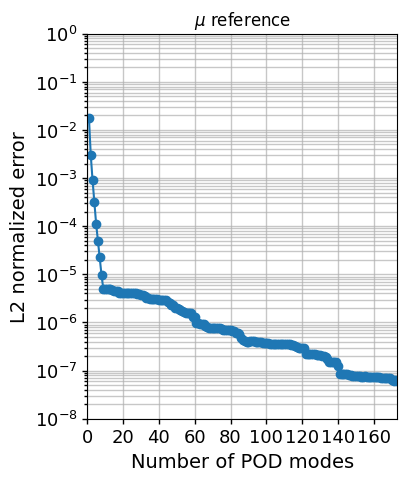

In [9]:
fig, (ax1) = plt.subplots(1, figsize=(4,5))
ax1.set_yscale('log')
ax1.plot(dimensions,errors_L2,  '-o')
ax1.tick_params(axis="y", which='both',labelsize=13,  width=1)
ax1.tick_params(axis='x', labelsize=13,  width=1)
ax1.set_xlabel('Number of POD modes',fontsize=14)
ax1.set_ylabel('L2 normalized error',fontsize=14)
#ax1.axvspan(1, NN, color='gray', alpha=0.2)
xticks = np.arange(0, max_dim, 20)  
ax1.set_xticks(xticks)
ax1.set_xlim([0, max_dim])
ax1.set_ylim([1e-8, 1])
ax1.set_title(rf'$\mu$ reference')
ax1.grid(visible=True, which='both', linewidth=1, alpha=0.7)
plt.savefig(os.path.join('plot/reference case/L2 error.pdf'), bbox_inches='tight')

## **Worst reconstructed parameters**

In [12]:
# Lettura dei parametri di riferimento dal file JSON
#with open("../0. full order/data/Reference_parameters.json", "r") as json_file:
with open("checkpoint/worst_reconstructed_parameters.json", "r") as json_file:
    parameters = json.load(json_file)
FISSION_ENERGY = parameters["FISSION_ENERGY"] 
FISSION_RATE = parameters["FISSION_RATE"]  
T_BC = parameters["T_BC"]  
LENGTH = parameters["LENGTH"]  
RADIUS = parameters["RADIUS"]  
FISSION_YIELD = parameters["FISSION_YIELD"]  
FUEL_THERMAL_CONDUCTIVITY  = parameters["FUEL_THERMAL_CONDUCTIVITY"]  
TIME_DELTA = 1.00E+04
SOURCE_C = FISSION_RATE * FISSION_YIELD         #[atm / (m^3 s)]
GAMMA_T = (FISSION_RATE * FISSION_ENERGY * LENGTH**2)/(FUEL_THERMAL_CONDUCTIVITY)

solution_FO = np.loadtxt('worst reconstructed case/Fullorder_Cfield.csv', delimiter=',')  # Soluzione FOM
MM_FO = np.load('model_files/XX_FO.npy', allow_pickle=True)[0]  # Matrice per norma L2

with h5py.File('checkpoint/matrici_RB.h5', 'r') as hf:
    # Accedi ai dataset e ricrea le matrici
    ZZ_CO = hf['ZZ_CO'][:]
    II_CO = hf['II_CO'][:]
    basis = hf['basis'][:]


TT = T_BC + GAMMA_T * (1 - ZZ_CO**2) / 2
WW = 7.60E-10 * np.exp(- 4.86E-19 / (TT * 1.380649E-23)) +\
     5.64E-25 * np.exp(- 1.91E-19 / (TT * 1.380649E-23)) * np.sqrt(FISSION_RATE) +\
     8.00E-40 * FISSION_RATE
CC_CO = np.hstack((II_CO @ WW / RADIUS**2, II_CO @ WW / LENGTH**2))

# Iterazione sulle dimensioni delle basi ridotte
errors_L2 = []
dimensions = []
max_dim = max(basis[1].shape)


for dim in range(1, max_dim+1):  # Da 1 a 57
    # Riduzione della base
    with h5py.File('checkpoint/matrici_RB.h5', 'r') as hf:
        MM_RB = hf['MM_RB'][:dim, :dim]
        FF_RB = hf['FF_RB'][:dim]
        KK_RB = hf['KK_RB'][:, :dim, :dim]
        AA_RB = hf['AA_RB'][:dim]
        basis = hf['basis'][:, :dim]
    

    # Inizializzazione della soluzione ridotta
    old_sol_RB = np.zeros((dim, 1))
    
    # Proiezione delle matrici nello spazio ridotto
    SS_RB = np.tensordot(CC_CO, KK_RB, axes=[0, 0])
    QQ_RB = SOURCE_C * FF_RB
    LHS_RB_static = MM_RB + TIME_DELTA * SS_RB #matrice + matrice * scalare. Avendo il termine MM_RB al lhs è forward euler, se invece fosse nel RHS sarebbe Backward. 
    RHS_RB_static = TIME_DELTA * QQ_RB         #vettore per scalare
    LU, PIV = sp.linalg.lu_factor(LHS_RB_static)

    # Calcolo della soluzione ridotta
    LHS_RB_reduced = MM_RB + TIME_DELTA * SS_RB
    RHS_RB_reduced = TIME_DELTA * QQ_RB
    for _ in range(1000):
        old_sol_RB = sp.linalg.lu_solve((LU, PIV), RHS_RB_static + MM_RB.dot(old_sol_RB))

    # Ricostruzione nello spazio completo
    ROM = np.dot(basis, old_sol_RB[:,0])
    
    # Calcolo dell'errore in norma L2
    difference = solution_FO[mask_in_C, 1000] - ROM
    L2_norm = np.sqrt(MM_FO.dot(difference).dot(difference))
    reference_norm = np.sqrt(MM_FO.dot(solution_FO[mask_in_C, 1000]).dot(solution_FO[mask_in_C, 1000]))
    L2_normalized = L2_norm / reference_norm
    
    # Salva i risultati
    errors_L2.append(L2_normalized)
    dimensions.append(dim)
    print(f"Dim: {dim}, L2 normalized error: {L2_normalized}")

# Risultati finali
print("Dimensioni delle basi:", dimensions)
print("Errori normalizzati in norma L2:", errors_L2)

Dim: 1, L2 normalized error: 0.6265807032629555
Dim: 2, L2 normalized error: 0.41925361703957525
Dim: 3, L2 normalized error: 0.3889351096608498
Dim: 4, L2 normalized error: 0.36979766197264874
Dim: 5, L2 normalized error: 0.36777539535083964
Dim: 6, L2 normalized error: 0.34662740933276853
Dim: 7, L2 normalized error: 0.3169404359930963
Dim: 8, L2 normalized error: 0.31909352823639536
Dim: 9, L2 normalized error: 0.31226515845794256
Dim: 10, L2 normalized error: 0.3122102133457157
Dim: 11, L2 normalized error: 0.31216384597646857
Dim: 12, L2 normalized error: 0.3120992320435444
Dim: 13, L2 normalized error: 0.018335390700896514
Dim: 14, L2 normalized error: 0.016075577069555713
Dim: 15, L2 normalized error: 0.009731144060791458
Dim: 16, L2 normalized error: 0.010126892876798268
Dim: 17, L2 normalized error: 0.008020134236306743
Dim: 18, L2 normalized error: 0.007476857492070232
Dim: 19, L2 normalized error: 0.007472977456766396
Dim: 20, L2 normalized error: 0.007473619789071954
Dim: 2

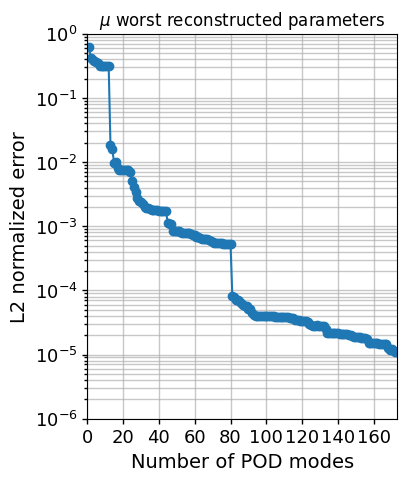

In [15]:
fig, (ax1) = plt.subplots(1, figsize=(4,5))
ax1.set_yscale('log')
ax1.plot(dimensions,errors_L2,  '-o')
ax1.tick_params(axis="y", which='both',labelsize=13,  width=1)
ax1.tick_params(axis='x', labelsize=13,  width=1)
ax1.set_xlabel('Number of POD modes',fontsize=14)
ax1.set_ylabel('L2 normalized error',fontsize=14)
#ax1.axvspan(1, NN, color='gray', alpha=0.2)
xticks = np.arange(0, max_dim, 20)  
ax1.set_xticks(xticks)
ax1.set_xlim([0, max_dim])
ax1.set_ylim([1e-6, 1])
ax1.set_title(rf'$\mu$ worst reconstructed parameters')
ax1.grid(visible=True, which='both', linewidth=1, alpha=0.7)
plt.savefig(os.path.join('plot/worst reconstructed case/Missing energy.pdf'), bbox_inches='tight')

# **L2 norm in time**

In [16]:
# Pulizia
from IPython import get_ipython
get_ipython().magic('clear')
get_ipython().magic('reset -f')

# Import libraries:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy as sp
import scipy.sparse as sparse
import h5py
import sys
import os
import json

# Import user-defined libraries:
from FreeFEM import FFmatrix_fread, FFvector_fread
from solver_class import FiniteElementCylinderSolver, ReducedBasisCylinderSolver

/var/folders/gs/p2p59ns16hlgpqv_027665gm0000gn/T/ipykernel_2322/783888955.py:3: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  get_ipython().magic('clear')
/var/folders/gs/p2p59ns16hlgpqv_027665gm0000gn/T/ipykernel_2322/783888955.py:4: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  get_ipython().magic('reset -f')


In [19]:
# Load coordinates:
coordinates_Px = FFvector_fread('mesh_utilities/vv_cc_Px.btxt')
coordinates_Pq = FFvector_fread('mesh_utilities/vv_cc_Pq.btxt')

# Identify degrees of freedom of the Px and Pq spaces:
sFO_Px = coordinates_Px.shape[0]
sFO_Pq = coordinates_Pq.shape[0]
print(rf'Degree of freedom = {sFO_Px}')

# Define vector of all Px indeces:
mask_all = np.arange(sFO_Px, dtype=int)

# Identify indeces of the top, bottom and middle boundaries in Px:
mask_inf_bc = mask_all[np.isclose([coordinates_Px[ii, 1] for ii in range(sFO_Px)], np.zeros((sFO_Px)))]
mask_sup_bc = mask_all[np.isclose([coordinates_Px[ii, 1] for ii in range(sFO_Px)], np.ones((sFO_Px)))]
mask_mid_bc = mask_all[np.isclose([coordinates_Px[ii, 0] for ii in range(sFO_Px)], np.zeros((sFO_Px)))]
mask_ext_bc = mask_all[np.isclose([coordinates_Px[ii, 0] for ii in range(sFO_Px)], np.ones((sFO_Px)))]

# Identify indeces of the Dirichlet b.c. for the temperature and concentration field:
mask_bc_T = np.fromiter(set(mask_sup_bc), int)
mask_bc_C = np.fromiter(set(mask_sup_bc) | set(mask_ext_bc) | set(mask_inf_bc), int)

# Identify indeces of the interior for the temperature and concentration field:
mask_in_T = [ii for ii in mask_all if ii not in mask_bc_T]
mask_in_C = [ii for ii in mask_all if ii not in mask_bc_C]

# Import mass matrices on the Px and on the Pq space:
mass_Px = FFmatrix_fread('mesh_utilities/ww_mm_Px.btxt')
mass_Pq = FFmatrix_fread('mesh_utilities/ww_mm_Pq.btxt')
mass_Pm = FFmatrix_fread('mesh_utilities/ww_uu_Px_Pq.btxt')

# Extract integration weights and diagonal matrix with their inverse:
weights_Pq = mass_Pq.diagonal()
project_Pq = sparse.diags(np.reciprocal(weights_Pq))

# Import map from Px to Pq and to the dx, dy, dz derivative evaluated in Pq:
PxtoPquu_C = project_Pq.dot(FFmatrix_fread('mesh_utilities/ww_uu_Px_Pq.btxt')[:, mask_in_C])
PxtoPqdx_C = project_Pq.dot(FFmatrix_fread('mesh_utilities/ww_dx_Px_Pq.btxt')[:, mask_in_C])
PxtoPqdy_C = project_Pq.dot(FFmatrix_fread('mesh_utilities/ww_dy_Px_Pq.btxt')[:, mask_in_C])

# Define weights for the integration in polar coordinates:
polar_weights_Pq = np.multiply(coordinates_Pq[:, 0], weights_Pq)

# Compute volume of the domain:
volume = np.dot(np.ones(sFO_Pq), polar_weights_Pq)

# Assemble mass matrix and projected forcing term:
forc_C = PxtoPquu_C.T.dot(polar_weights_Pq[:, None])
mass_C = PxtoPquu_C.T.dot(PxtoPquu_C.multiply(polar_weights_Pq[:, None]))
inte_C = PxtoPquu_C.T.dot(polar_weights_Pq) / volume

Degree of freedom = 10201


NameError: name 'sparse' is not defined

In [20]:
FOM = np.loadtxt('worst reconstructed case/Fullorder_Cfield.csv', delimiter=',')  # (102391 x 1001)
MM_FO = np.load('model_files/XX_FO.npy', allow_pickle=True)[0]  # Matrice per norma L2

with open("checkpoint/worst_reconstructed_parameters.json", "r") as json_file:
    parameters = json.load(json_file)
FISSION_ENERGY = parameters["FISSION_ENERGY"] 
FISSION_RATE = parameters["FISSION_RATE"]  
T_BC = parameters["T_BC"]  
LENGTH = parameters["LENGTH"]  
RADIUS = parameters["RADIUS"]  
FISSION_YIELD = parameters["FISSION_YIELD"]  
FUEL_THERMAL_CONDUCTIVITY  = parameters["FUEL_THERMAL_CONDUCTIVITY"]  
TIME_DELTA = 1.00E+04
SOURCE_C = FISSION_RATE * FISSION_YIELD         #[atm / (m^3 s)]
GAMMA_T = (FISSION_RATE * FISSION_ENERGY * LENGTH**2)/(FUEL_THERMAL_CONDUCTIVITY)

with h5py.File('checkpoint/matrici_RB.h5', 'r') as hf:
    ZZ_CO = hf['ZZ_CO'][:]
    II_CO = hf['II_CO'][:]
    basis = hf['basis'][:]

TT = T_BC + GAMMA_T * (1 - ZZ_CO**2) / 2
WW = 7.60E-10 * np.exp(- 4.86E-19 / (TT * 1.380649E-23)) +\
     5.64E-25 * np.exp(- 1.91E-19 / (TT * 1.380649E-23)) * np.sqrt(FISSION_RATE) +\
     8.00E-40 * FISSION_RATE
CC_CO = np.hstack((II_CO @ WW / RADIUS**2, II_CO @ WW / LENGTH**2))
      
max_dim = max(basis[1].shape)
num_time_steps = 1001
errors_L2 = np.zeros((max_dim, num_time_steps))

for dim in range(0, max_dim+1):
    # Riduzione della base
    with h5py.File('checkpoint/matrici_RB.h5', 'r') as hf:
        MM_RB = hf['MM_RB'][:dim, :dim]
        FF_RB = hf['FF_RB'][:dim]
        KK_RB = hf['KK_RB'][:, :dim, :dim]
        AA_RB = hf['AA_RB'][:dim]
        basis = hf['basis'][:, :dim]
    
    # Inizializzazione della soluzione ridotta
    old_sol_RB = np.zeros((dim, 1))

    SS_RB = np.tensordot(CC_CO, KK_RB, axes=[0, 0])
    QQ_RB = SOURCE_C * FF_RB
    LHS_RB_static = MM_RB + TIME_DELTA * SS_RB #matrice + matrice * scalare. Avendo il termine MM_RB al lhs è forward euler, se invece fosse nel RHS sarebbe Backward. 
    RHS_RB_static = TIME_DELTA * QQ_RB         #vettore per scalare
    LU, PIV = sp.linalg.lu_factor(LHS_RB_static)

    LHS_RB_reduced = MM_RB + TIME_DELTA * SS_RB
    RHS_RB_reduced = TIME_DELTA * QQ_RB
    ROM = np.zeros((num_time_steps))
    for ii in range(1,num_time_steps):
        old_sol_RB = sp.linalg.lu_solve((LU, PIV), RHS_RB_static + MM_RB.dot(old_sol_RB))
        ROM = np.dot(basis, old_sol_RB[:,0])     #ricostruisco a quel specifico time step
        difference = FOM[mask_in_C, ii] - ROM
        L2_norm = np.sqrt(MM_FO.dot(difference).dot(difference))
        reference_norm = np.sqrt(MM_FO.dot(FOM[mask_in_C, ii]).dot(FOM[mask_in_C, ii]))
        L2_normalized = L2_norm / reference_norm
        errors_L2[dim-1, ii] = L2_normalized 

        print(f"Dim: {dim}, time: {TIME_DELTA*ii}, L2 normalized error: {L2_normalized}")


Dim: 1, time: 10000.0, L2 normalized error: 0.5472979130916422
Dim: 1, time: 20000.0, L2 normalized error: 0.5332211467707545
Dim: 1, time: 30000.0, L2 normalized error: 0.524088075553617
Dim: 1, time: 40000.0, L2 normalized error: 0.5180440370454217
Dim: 1, time: 50000.0, L2 normalized error: 0.5141369656122046
Dim: 1, time: 60000.0, L2 normalized error: 0.5117939873767923
Dim: 1, time: 70000.0, L2 normalized error: 0.5106348750057998
Dim: 1, time: 80000.0, L2 normalized error: 0.5103903460133716
Dim: 1, time: 90000.0, L2 normalized error: 0.5108610169960532
Dim: 1, time: 100000.0, L2 normalized error: 0.5118945848572866
Dim: 1, time: 110000.0, L2 normalized error: 0.5133720907120919
Dim: 1, time: 120000.0, L2 normalized error: 0.5151991023126721
Dim: 1, time: 130000.0, L2 normalized error: 0.5172997509995193
Dim: 1, time: 140000.0, L2 normalized error: 0.5196125268102935
Dim: 1, time: 150000.0, L2 normalized error: 0.5220872134577688
Dim: 1, time: 160000.0, L2 normalized error: 0.524

In [21]:
np.savetxt("worst reconstructed case/errors_L2_in_time.csv", errors_L2, delimiter=",")

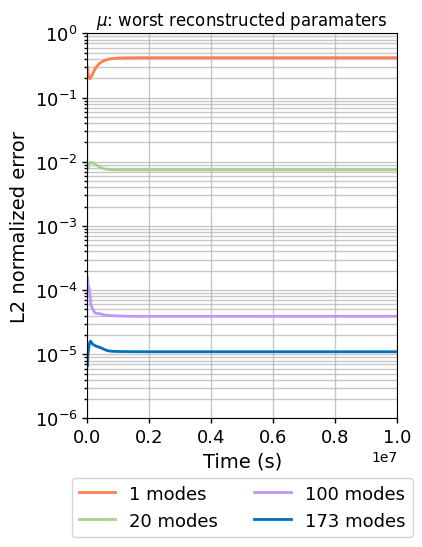

In [43]:
#prova = np.loadtxt('data/errors_L2_in_time.csv', delimiter=',')
time = np.linspace(0, 1e7, errors_L2.shape[1])[1:]

fig, (ax1) = plt.subplots(1, figsize=(4,5))
ax1.set_yscale('log')
ax1.plot(time,errors_L2[1,1:], color = '#FF7F50',label='1 modes', linewidth = 2)
ax1.plot(time,errors_L2[19,1:], color = '#A9D18E',label='20 modes', linewidth = 2)
ax1.plot(time,errors_L2[110,1:], color = '#BB9AF7',label='100 modes', linewidth = 2)
ax1.plot(time,errors_L2[172,1:], color = '#0072bd',label='173 modes', linewidth = 2)
ax1.tick_params(axis="y", which='both',labelsize=13,  width=1)
ax1.tick_params(axis='x', labelsize=13,  width=1)
ax1.set_xlabel('Time (s)',fontsize=14)
ax1.set_ylabel('L2 normalized error',fontsize=14)
#xticks = np.arange(0, 58, 5)  
#ax1.set_xticks(xticks)
ax1.set_xlim([0, 1e7])
ax1.legend()
ax1.set_ylim([1e-6, 1])
ax1.set_title(rf'$\mu$: worst reconstructed paramaters')
ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.13), fancybox=True, shadow=False, ncol=2, fontsize=13)
ax1.grid(visible=True, which='both', linewidth=1, alpha=0.7)
plt.savefig('plot/worst reconstructed case/L2 error in time.pdf', bbox_inches='tight') 